# Code source and changes

Code originally comes from https://github.com/qubvel-org/segmentation_models.pytorch/blob/main/examples/camvid_segmentation_multiclass.ipynb, edits are made to collect and format our Arabadopsis data and use UNet.

In [2]:
%pip install --upgrade segmentation-models-pytorch lightning albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [4]:
# Training visualization prep
%load_ext tensorboard

# Usage
Run the following code block and upload all original images (the 367 of them) from the replicate_1_5 batch to original images and the masks folder (including 367 masks and 367*2 other files we'll ignore in this code) to the mask folder we create here.

# Install package

In [1]:
import os

base_dir = ''

image_dir = os.path.join(base_dir, 'images')
mask_dir = os.path.join(base_dir, 'masks')

os.makedirs(image_dir, exist_ok=True)
os.makedirs(mask_dir, exist_ok=True)

print("Directories created! Upload your images to '/images' and masks to '/masks'.")

Directories created! Upload your images to '/images' and masks to '/masks'.


In [5]:
def image_to_mask_name(image_name):
    """Converts an image name like <name>.jpg to <name>_gtFine_color.png"""
    mask_name = image_name.replace(".jpg", "_gtFine_color.png")
    return mask_name

Image path: images/Rep1_0%Sucrose_gaut3-1gaut10-3gaut11-3+_14.jpg
Expected mask path: masks/Rep1_0%Sucrose_gaut3-1gaut10-3gaut11-3+_14_gtFine_color.png


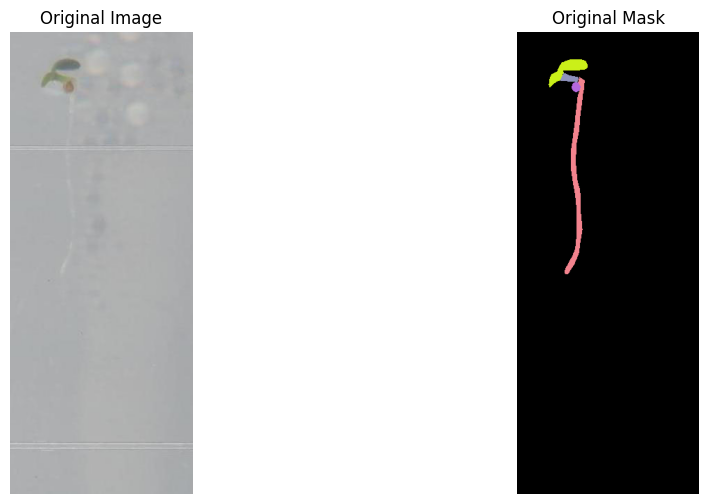

In [6]:
# Use this block to verify an images original image and mask are for the same plant

import os
import cv2
import matplotlib.pyplot as plt

def check_image_mask_pair(image_dir, mask_dir, image_name):
    image_path = f"{image_dir}/{image_name}"
    mask_name = image_to_mask_name(image_name)
    mask_path = f"{mask_dir}/{mask_name}"

    print(f"Image path: {image_path}")
    print(f"Expected mask path: {mask_path}")

    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path)

    if image is None:
        print("Failed to load image.")
    if mask is None:
        print("Failed to load mask.")

    if image is not None and mask is not None:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(image)
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.title("Original Mask")
        plt.imshow(mask)
        plt.axis("off")

        plt.show()

# Example usage
image_dir = "images"
mask_dir = "masks"
image_name = "Rep1_0%Sucrose_gaut3-1gaut10-3gaut11-3+_14.jpg"
check_image_mask_pair(image_dir, mask_dir, image_name)

In [7]:
import os
import shutil
import random

# Set the seed for reproducibility
random.seed(42)

# Output directories for train/val/test splits
base_output_dir = ""
train_dir = os.path.join(base_output_dir, "train")
valid_dir = os.path.join(base_output_dir, "valid")
test_dir = os.path.join(base_output_dir, "test")

# Create train/val/test directories if they don't exist
for folder in [train_dir, valid_dir, test_dir]:
    os.makedirs(folder, exist_ok=True)

# Split ratio
train_ratio = 0.7
valid_ratio = 0.15
test_ratio = 0.15

# Get all image filenames (just the .jpg ones)
image_dir = "images"
mask_dir = "masks"
images = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]

# Pair each image with its corresponding mask using the naming convention
data = []
for img in images:
    expected_mask = image_to_mask_name(img)
    if not os.path.exists(os.path.join(mask_dir, expected_mask)):
        raise FileNotFoundError(f"Mask not found for image {img}. Expected: {expected_mask}")
    data.append((img, expected_mask))

# Shuffle the pairs (safe, because they're already matched)
random.shuffle(data)

# Split data into train/val/test
train_size = int(len(data) * train_ratio)
valid_size = int(len(data) * valid_ratio)

train_data = data[:train_size]
valid_data = data[train_size:train_size + valid_size]
test_data = data[train_size + valid_size:]

# Move images and masks into respective folders, renaming masks to match images
def move_files(data, dest_dir):
    for img, mask in data:
        img_src = os.path.join(image_dir, img)
        mask_src = os.path.join(mask_dir, mask)

        img_dest = os.path.join(dest_dir, "images", img)
        mask_name = image_to_mask_name(img)
        mask_dest = os.path.join(dest_dir, "masks", mask_name)

        # Create subdirectories if they don't exist
        os.makedirs(os.path.dirname(img_dest), exist_ok=True)
        os.makedirs(os.path.dirname(mask_dest), exist_ok=True)

        shutil.copy(img_src, img_dest)
        shutil.copy(mask_src, mask_dest)

# Move train, valid, and test data
move_files(train_data, train_dir)
move_files(valid_data, valid_dir)
move_files(test_data, test_dir)

print("Data has been successfully split into train/valid/test directories.")

Data has been successfully split into train/valid/test directories.


In [8]:
import os
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

In [9]:
# Set the base directory for your images and masks
base_dir = ""

x_train_dir = os.path.join(base_dir, "train", "images")
y_train_dir = os.path.join(base_dir, "train", "masks")

x_valid_dir = os.path.join(base_dir, "valid", "images")
y_valid_dir = os.path.join(base_dir, "valid", "masks")

x_test_dir = os.path.join(base_dir, "test", "images")
y_test_dir = os.path.join(base_dir, "test", "masks")

# Dataloader
Writing helper class for data extraction, tranformation and preprocessing
https://pytorch.org/docs/stable/data

In [10]:
# for debugging
def verify_dataset_imgs_and_masks(images_fps, masks_fps):
  # Extract the image filename from the full image path
  for image_path, mask_path in zip(images_fps, masks_fps):
      image_filename = os.path.basename(image_path)

      # Get the expected mask filename using the image_to_mask_name function
      expected_mask_name = image_to_mask_name(image_filename)

      # Extract the mask filename from the full mask path
      mask_filename = os.path.basename(mask_path)

      # Check if the expected mask name matches the actual mask filename
      if expected_mask_name != mask_filename:
          # print(f"Mismatch found!")
          # print(f"Image: {image_filename}")
          # print(f"Expected mask: {expected_mask_name}")
          # print(f"Actual mask: {mask_filename}")
          raise ValueError(f"Mask name mismatch for image: {image_filename}")

In [11]:
import os
import cv2
import numpy as np
import albumentations as A


class Dataset(BaseDataset):
    CLASSES = [
        "leaf",
        "stem",
        "seed",
        "root",
        "background",
    ]

    def __init__(self, images_dir, masks_dir, classes=None, augmentation=None):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_to_mask_name(image_id)) for image_id in self.ids]

        # DEBUG: images and masks aren't matching up, let's require them to
        verify_dataset_imgs_and_masks(self.images_fps, self.masks_fps)

        # Always map background ('background') to 0
        self.background_class = self.CLASSES.index("background")

        # If specific classes are provided, map them dynamically
        if classes:
            self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        else:
            self.class_values = list(range(len(self.CLASSES)))  # Default to all classes

        # Create a remapping dictionary: class value in dataset -> new index (0, 1, 2, ...)
        # Background will always be 0, other classes will be remapped starting from 1.
        self.class_map = {self.background_class: 0}
        self.class_map.update(
            {
                v: i + 1
                for i, v in enumerate(self.class_values)
                if v != self.background_class
            }
        )

        self.augmentation = augmentation

        # DEBUG
        # print(f"Class map: {self.class_map}")

    def __getitem__(self, i):
      # DEBUG
      # print(f"Image path: {self.images_fps[i]}")
      # print(f"Mask path: {self.masks_fps[i]}")

      # Read the image
      image = cv2.imread(self.images_fps[i])

      # DEBUG
      if image is None:
        # print(f"Error loading image: {self.images_fps[i]}")
        raise ValueError(f"Error loading image: {self.images_fps[i]}")

      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

      # Replace .jpg with .png to find the corresponding mask
      mask_path = self.masks_fps[i].replace(".jpg", ".png")
      mask = cv2.imread(mask_path)

      # DEBUG
      if mask is None:
          # print(f"Error loading mask: {self.masks_fps[i]}")
          raise ValueError(f"Error loading mask: {self.masks_fps[i]}")

      # Create a blank mask to remap the class values
      mask_remap = np.zeros((mask.shape[0], mask.shape[1]), dtype=np.uint8)

      # Define RGB-to-class mapping
      RGB_TO_CLASS = {
          (0, 0, 0): "background",
          (25, 240, 202): "leaf",
          (189, 146, 142): "stem",
          (222, 104, 181): "seed",
          (142, 131, 243): "root",
      }

      # DEBUG
      unique_colors = np.unique(mask.reshape(-1, mask.shape[2]), axis=0)  # Reshape to 2D and get unique RGB values
      # print(mask_path)
      # if np.array([222, 104, 181]) not in unique_colors:
      #   print(f"seed not found in {mask_path}")

      def verify_mask_classification(mask):
        # Debug color mismatch
        class_count = {class_name: 0 for class_name in RGB_TO_CLASS.values()}
        unclassified_count = 0

        # Get the shape of the mask
        height, width, _ = mask.shape

        # Loop through each pixel and check its RGB value
        for i in range(height):
            for j in range(width):
                pixel = tuple(mask[i, j])  # Get the RGB value of the pixel
                if pixel in RGB_TO_CLASS:
                    class_name = RGB_TO_CLASS[pixel]
                    class_count[class_name] += 1
                else:
                    unclassified_count += 1

         # Print the counts for each class
        # print("Class counts:")
        # for class_name, count in class_count.items():
            # print(f"{class_name}: {count} pixels")

        # Print the number of unclassified pixels
        if unclassified_count > 0:
            raise ValueError(f"Found {unclassified_count} unclassified pixels in the mask!")

      verify_mask_classification(mask)

      # Create a mapping from RGB values to class indices
      class_map = {v: i for i, v in enumerate(RGB_TO_CLASS.values())}

      # Loop through each RGB value and remap to class indices
      for (r, g, b), class_name in RGB_TO_CLASS.items():
          mask_remap[np.all(mask == (r, g, b), axis=-1)] = class_map[class_name]

      # Apply augmentation if defined
      if self.augmentation:
          sample = self.augmentation(image=image, mask=mask_remap)
          image, mask_remap = sample["image"], sample["mask"]

      image = image.transpose(2, 0, 1)

      return image, mask_remap

    def __len__(self):
        return len(self.ids)

In [12]:
import matplotlib.pyplot as plt
import numpy as np

def visualize(**images):
    """Plot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))

    # Define RGB-to-class mapping for visualization (adjust according to your dataset)
    class_to_rgb = {
        0: np.array([0, 0, 0]),        # Background
        1: np.array([202, 240, 25]),   # Leaf
        2: np.array([142, 146, 189]),  # Stem
        3: np.array([181, 104, 222]),  # Seed
        4: np.array([243, 131, 142]),  # Root
    }


    def count_class_pixels(mask_remap):
      # Count the number of pixels for each class
      unique, counts = np.unique(mask_remap, return_counts=True)
      class_pixel_count = dict(zip(unique, counts))

      # Print the class distribution
      # for class_id, count in class_pixel_count.items():
      #     print(f"Class {class_id}: {count} pixels")


    # Function to apply the colormap to the remapped mask
    def apply_colormap(mask_remap):
        # Create an empty RGB mask with the same height and width as the original mask
        rgb_mask = np.zeros((mask_remap.shape[0], mask_remap.shape[1], 3), dtype=np.uint8)

        # Loop through each class index and assign corresponding RGB values
        for class_index, color in class_to_rgb.items():
            rgb_mask[mask_remap == class_index] = color

        return rgb_mask

    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(" ".join(name.split("_")).title())

        # If it's an image, plot it as RGB
        if name == "image":
            # Convert CHW to HWC for plotting
            image = image.transpose(1, 2, 0)
            plt.imshow(image)
        elif name == "mask":
            # DEBUG
            count_class_pixels(image)

            # Apply colormap if it's the mask (ensure it's in 2D)
            image_colored = apply_colormap(image)  # mask should be 2D with class indices
            plt.imshow(image_colored)
        else:
            plt.imshow(image, cmap="tab20")

    plt.show()


In [13]:
dataset = Dataset(x_train_dir, y_train_dir)

for i in range(3):
  if i % 10 == 0:
    print(f"i/{len(dataset)}")

  image, mask = dataset[i]
  # print(f"Mask shape: {mask.shape}")
  # visualize(image=image, mask=mask)

i/256


In [14]:
# Verify the image from above in the training folder (copy paste in the image_name)
image_dir = "train/images"
mask_dir = "train/masks"
image_name = "Rep1_0%Sucrose_Col-0_10.jpg"
check_image_mask_pair(image_dir, mask_dir, image_name)

Image path: train/images/Rep1_0%Sucrose_Col-0_10.jpg
Expected mask path: train/masks/Rep1_0%Sucrose_Col-0_10_gtFine_color.png
Failed to load image.
Failed to load mask.


Image path: images/Rep1_0%Sucrose_Col-0_10.jpg
Expected mask path: masks/Rep1_0%Sucrose_Col-0_10_gtFine_color.png


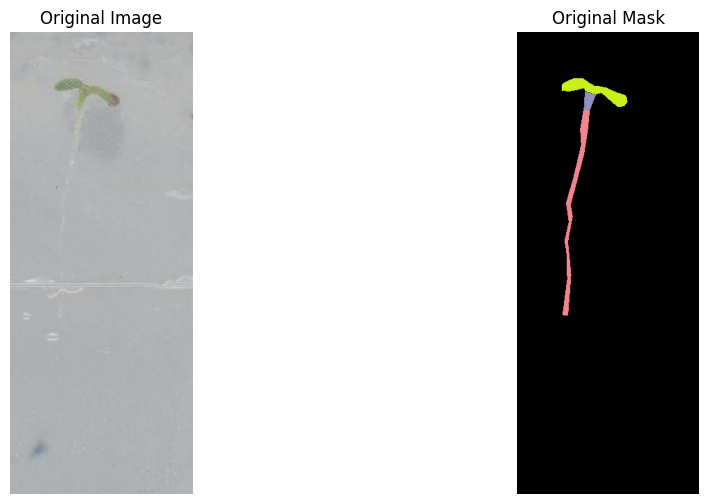

In [15]:
# Verify the image from above in the original folder (copy paste in the image_name)
image_dir = "images"
mask_dir = "masks"
image_name = "Rep1_0%Sucrose_Col-0_10.jpg"
check_image_mask_pair(image_dir, mask_dir, image_name)

# Augmentations
Data augmentation is a powerful technique to increase the amount of your data and prevent model overfitting.
If you not familiar with such trick read some of these articles:

 - [The Effectiveness of Data Augmentation in Image Classification using Deep Learning](http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf)
 - [Data Augmentation | How to use Deep Learning when you have Limited Data](https://medium.com/nanonets/how-to-use-deep-learning-when-you-have-limited-data-part-2-data-augmentation-c26971dc8ced)
 - [Data Augmentation Experimentation](https://towardsdatascience.com/data-augmentation-experimentation-3e274504f04b)

Since our dataset is very small we will apply a large number of different augmentations:

 - horizontal flip
 - affine transforms
 - perspective transforms
 - brightness/contrast/colors manipulations
 - image bluring and sharpening
 - gaussian noise
 - random crops

All this transforms can be easily applied with [**Albumentations**](https://github.com/albu/albumentations/) - fast augmentation library. For detailed explanation of image transformations you can look at [**kaggle salt segmentation exmaple**](https://github.com/albu/albumentations/blob/master/notebooks/example_kaggle_salt.ipynb) provided by [**Albumentations**](https://github.com/albu/albumentations/) authors.

In [18]:
# training set images augmentation
def get_training_augmentation():
    train_transform = [
        A.HorizontalFlip(p=0.5),

        A.ShiftScaleRotate(
            scale_limit=0.1,
            rotate_limit=10,
            shift_limit=0.05,
            p=1,
            border_mode=0,
        ),

        A.PadIfNeeded(min_height=672, min_width=288, always_apply=True),
        A.RandomCrop(height=672, width=288, always_apply=True),

        A.GaussNoise(p=0.1, std_range=(0.01, 0.05)),

        A.Perspective(p=0.3, scale=(0.005, 0.01)),

        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightnessContrast(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.Sharpen(p=1),
                A.Blur(blur_limit=2, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomBrightnessContrast(p=1),
                A.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),

        A.ElasticTransform(p=0.2, alpha=1, sigma=10),
    ]

    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.PadIfNeeded(672, 288),
    ]
    return A.Compose(test_transform)

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
<ipython-input-18-c5be1088a46d>:14: UserWarning: Argument(s) 'always_apply' are not valid for transform PadIfNeeded
  A.PadIfNeeded(min_height=672, min_width=288, always_apply=True),
<ipython-input-18-c5be1088a46d>:15: UserWarning: Argument(s) 'always_apply' are not valid for transform RandomCrop
  A.RandomCrop(height=672, width=288, always_apply=True),
/usr/local/lib/python3.11/dist-packages/albumentations/augmentations/blur/functional.py:231: UserWarning: blur_limit: Invalid kernel size range (3, 2). Values less than 3 are not allowed. Range automatically adjusted to (3, 3).
  result = _ensure_min_value(result, min_value, info.field_name)


Mask shape: (672, 288)
[0 1 2 3 4]


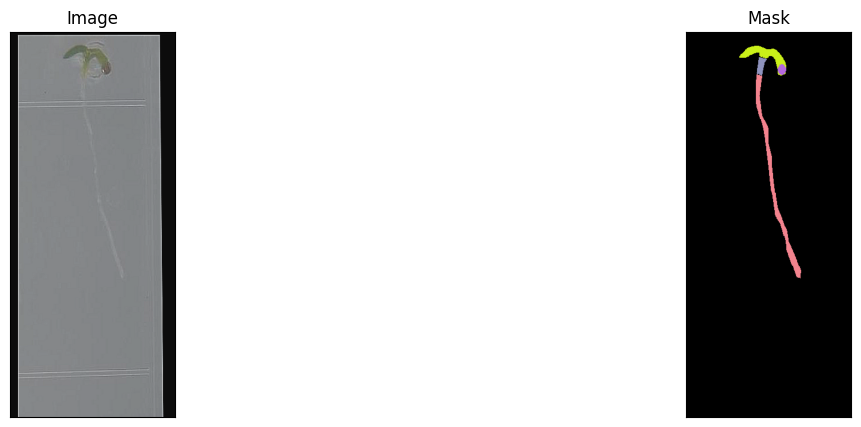

Mask shape: (672, 288)
[0 1 2 3 4]


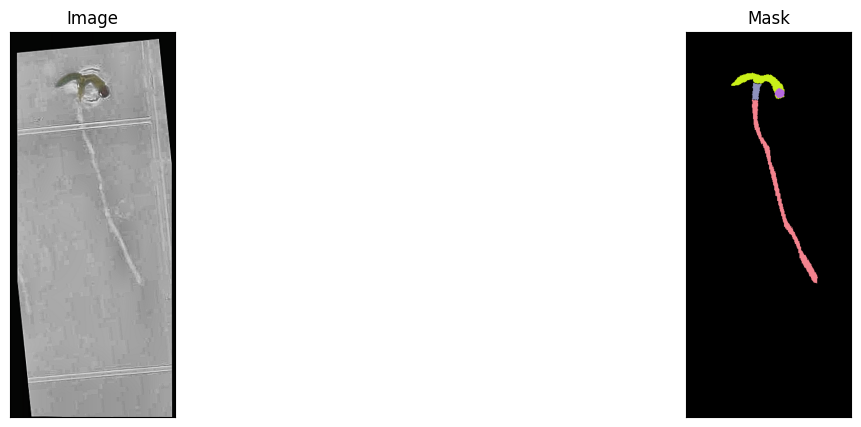

Mask shape: (672, 288)
[0 1 2 3 4]


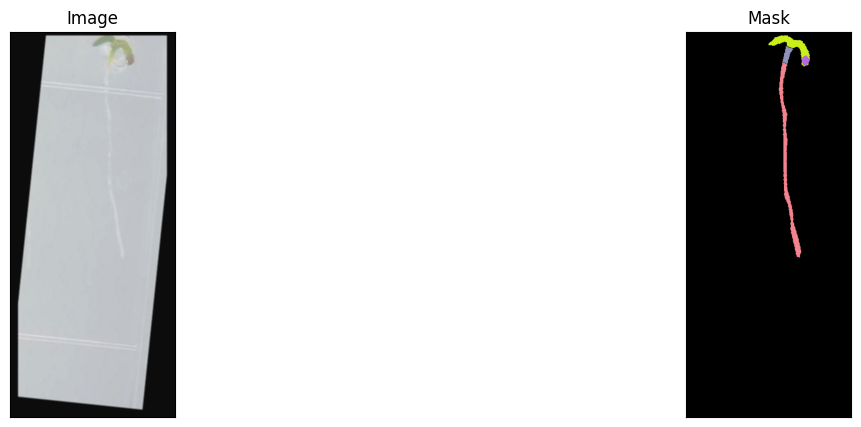

Mask shape: (672, 288)
[0 1 2 3 4]


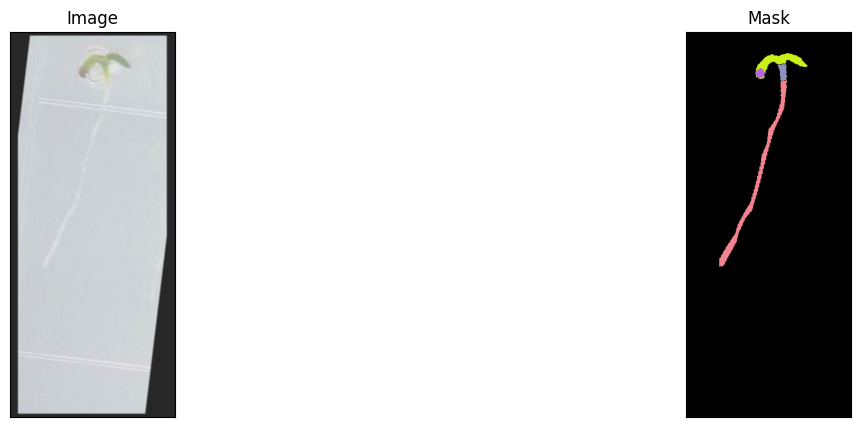

Mask shape: (672, 288)
[0 1 2 3 4]


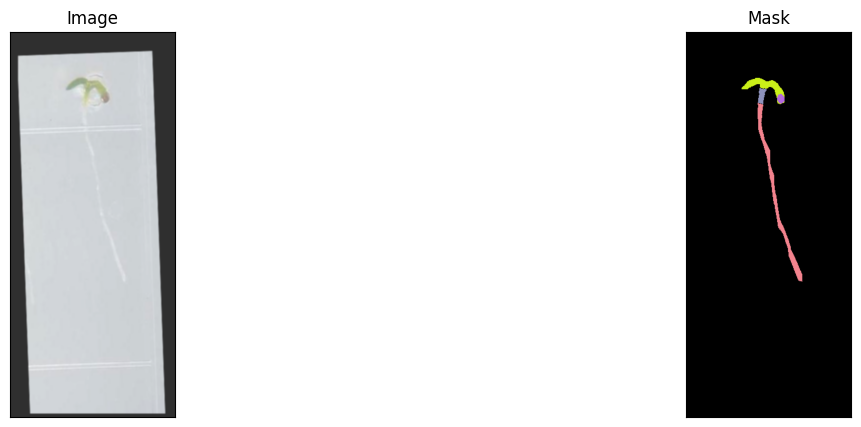

Mask shape: (672, 288)
[0 1 2 3 4]


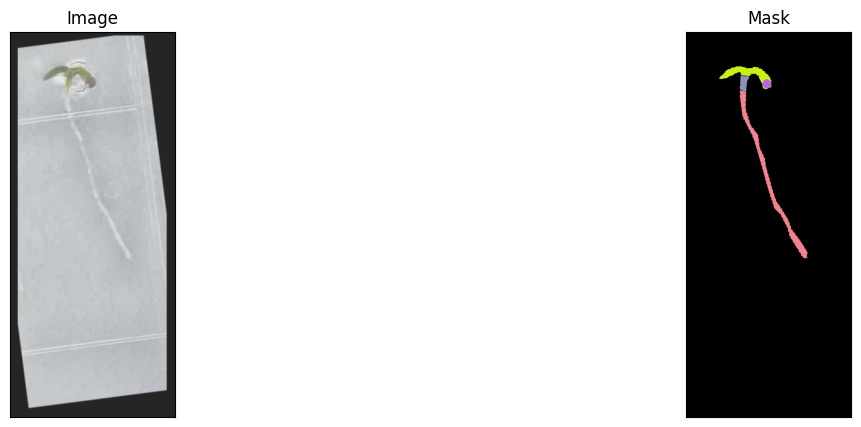

Mask shape: (672, 288)
[0 1 2 3 4]


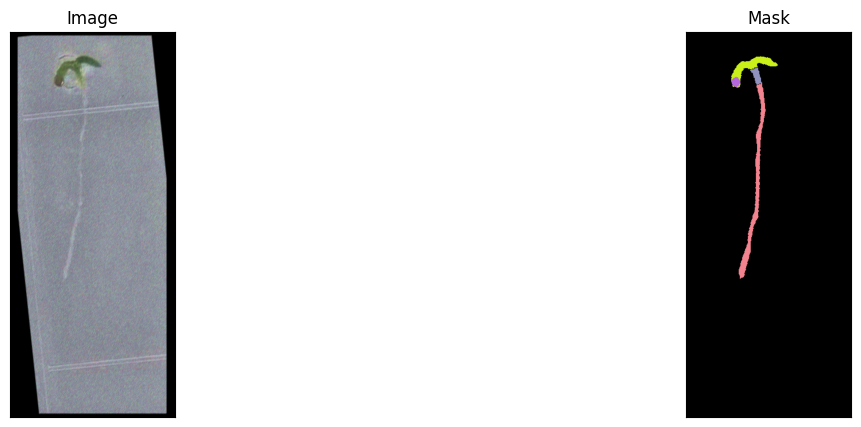

Mask shape: (672, 288)
[0 1 2 3 4]


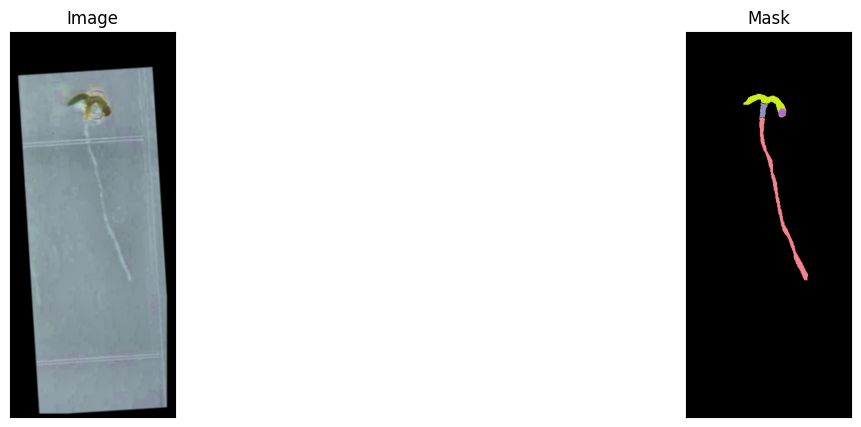

Mask shape: (672, 288)
[0 1 2 3 4]


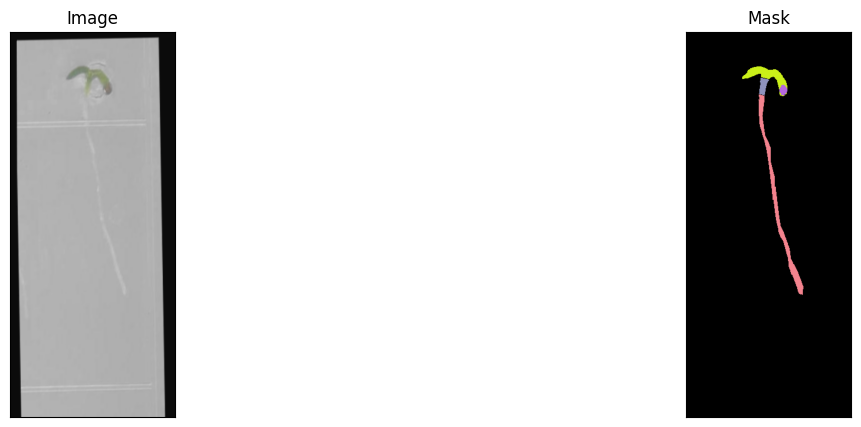

Mask shape: (672, 288)
[0 1 2 3 4]


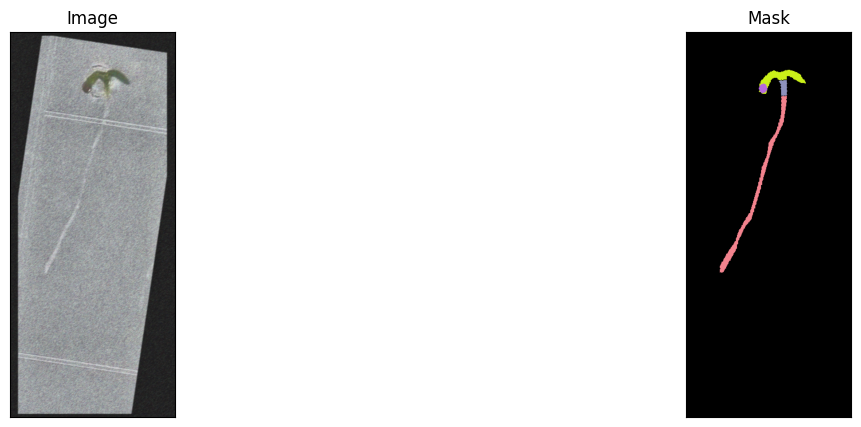

In [19]:
# Visualize resulted augmented images and masks
augmented_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    augmentation=get_training_augmentation(),
)

# Visualizing the same image with different random transforms
for i in range(10):
    image, mask = augmented_dataset[3]
    print(f"Mask shape: {mask.shape}")
    print(np.unique(mask))
    visualize(image=image, mask=mask)

In [20]:
train_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    augmentation=get_training_augmentation(),
)

valid_dataset = Dataset(
    x_valid_dir,
    y_valid_dir,
    augmentation=get_validation_augmentation(),
)

test_dataset = Dataset(
    x_test_dir,
    y_test_dir,
    augmentation=get_validation_augmentation(),
)

num_workers_colab = min(2, os.cpu_count())

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=num_workers_colab)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False, num_workers=num_workers_colab)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=num_workers_colab)

<ipython-input-18-c5be1088a46d>:14: UserWarning: Argument(s) 'always_apply' are not valid for transform PadIfNeeded
  A.PadIfNeeded(min_height=672, min_width=288, always_apply=True),
<ipython-input-18-c5be1088a46d>:15: UserWarning: Argument(s) 'always_apply' are not valid for transform RandomCrop
  A.RandomCrop(height=672, width=288, always_apply=True),


# Create model and train

In [21]:
# Some training hyperparameters
EPOCHS = 100
T_MAX = EPOCHS * len(train_loader)
# Always include the background as a class
OUT_CLASSES = len(train_dataset.CLASSES)

In [22]:
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
import torch
from torch.optim import lr_scheduler


class CamVidModel(pl.LightningModule):
    def __init__(self, arch, encoder_name, in_channels, out_classes, **kwargs):
        super().__init__()
        self.model = smp.create_model(
            arch,
            encoder_name=encoder_name,
            in_channels=in_channels,
            classes=out_classes,
            **kwargs,
        )

        # Preprocessing parameters for image normalization
        params = smp.encoders.get_preprocessing_params(encoder_name)
        self.number_of_classes = out_classes
        self.register_buffer("std", torch.tensor(params["std"]).view(1, 3, 1, 1))
        self.register_buffer("mean", torch.tensor(params["mean"]).view(1, 3, 1, 1))

        # Loss function for multi-class segmentation
        self.loss_fn = smp.losses.DiceLoss(smp.losses.MULTICLASS_MODE, from_logits=True)

        # Step metrics tracking
        self.training_step_outputs = []
        self.validation_step_outputs = []
        self.test_step_outputs = []

    def forward(self, image):
        # Normalize image
        image = (image - self.mean) / self.std
        mask = self.model(image)
        return mask

    def shared_step(self, batch, stage):
        image, mask = batch

        # Ensure that image dimensions are correct
        assert image.ndim == 4  # [batch_size, channels, H, W]

        # Ensure the mask is a long (index) tensor
        mask = mask.long()

        # Mask shape
        assert mask.ndim == 3  # [batch_size, H, W]

        # Predict mask logits
        logits_mask = self.forward(image)

        assert (
            logits_mask.shape[1] == self.number_of_classes
        )  # [batch_size, number_of_classes, H, W]

        # Ensure the logits mask is contiguous
        logits_mask = logits_mask.contiguous()

        # Compute loss using multi-class Dice loss (pass original mask, not one-hot encoded)
        loss = self.loss_fn(logits_mask, mask)

        # Apply softmax to get probabilities for multi-class segmentation
        prob_mask = logits_mask.softmax(dim=1)

        # Convert probabilities to predicted class labels
        pred_mask = prob_mask.argmax(dim=1)

        # Compute true positives, false positives, false negatives, and true negatives
        tp, fp, fn, tn = smp.metrics.get_stats(
            pred_mask, mask, mode="multiclass", num_classes=self.number_of_classes
        )

        return {
            "loss": loss,
            "tp": tp,
            "fp": fp,
            "fn": fn,
            "tn": tn,
        }

    def shared_epoch_end(self, outputs, stage):
        # Aggregate step metrics
        tp = torch.cat([x["tp"] for x in outputs])
        fp = torch.cat([x["fp"] for x in outputs])
        fn = torch.cat([x["fn"] for x in outputs])
        tn = torch.cat([x["tn"] for x in outputs])

        # Per-image IoU and dataset IoU calculations
        per_image_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro-imagewise")
        dataset_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")

        # Get the per-class IoU for each image and class (reduction="none")
        per_class_iou = smp.metrics.iou_score(tp, fp, fn, tn, reduction="none")

        # Log general metrics and per-class IoU in one call
        metrics = {
            f"{stage}_per_image_iou": per_image_iou,
            f"{stage}_dataset_iou": dataset_iou,
        }

        class_names = ["background", "leaf", "stem", "seed", "root"]

        # Identify which classes are present in the ground truth (non-zero in tp or fn)
        present_classes = tp.sum(dim=0) + fn.sum(dim=0) > 0  # any class with >0 ground truth

        # Add per-class IoU metrics to the log
        for class_idx in range(per_class_iou.shape[1]):  # Loop over all possible classes
            if present_classes[class_idx]:  # If the class is present in the ground truth
                iou = per_class_iou[:, class_idx].mean()  # Mean IoU for this class across the batch
                class_name = class_names[class_idx]
                metrics[f"{stage}_IoU_{class_name}"] = iou

        # Identify which classes are present (i.e., classes with non-zero IoU)
        present_classes = per_class_iou.any(dim=0).nonzero(as_tuple=True)[0]

        # Add per-class IoU metrics to the log
        for class_idx in present_classes:
            class_name = class_names[class_idx.item()]  # Convert tensor index to Python int
            iou = per_class_iou[:, class_idx].mean()  # Mean IoU for this class across the batch
            metrics[f"{stage}_IoU_{class_name}"] = iou

        # Log all metrics
        self.log_dict(metrics, prog_bar=True, on_epoch=True, logger=True)

        # Help with memory pressure
        torch.cuda.empty_cache()

    def training_step(self, batch, batch_idx):
        train_loss_info = self.shared_step(batch, "train")
        self.training_step_outputs.append(train_loss_info)
        return train_loss_info

    def on_train_epoch_end(self):
        self.shared_epoch_end(self.training_step_outputs, "train")
        self.training_step_outputs.clear()

    def validation_step(self, batch, batch_idx):
        valid_loss_info = self.shared_step(batch, "valid")
        self.validation_step_outputs.append(valid_loss_info)
        return valid_loss_info

    def on_validation_epoch_end(self):
        self.shared_epoch_end(self.validation_step_outputs, "valid")
        self.validation_step_outputs.clear()

    def test_step(self, batch, batch_idx):
        test_loss_info = self.shared_step(batch, "test")
        self.test_step_outputs.append(test_loss_info)
        return test_loss_info

    def on_test_epoch_end(self):
        self.shared_epoch_end(self.test_step_outputs, "test")
        self.test_step_outputs.clear()

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=2e-4)
        scheduler = lr_scheduler.CosineAnnealingLR(optimizer, T_max=50, eta_min=1e-5)
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "interval": "step",
                "frequency": 1,
            },
        }

In [23]:
import os

checkpoint_path = "/content/epoch105.ckpt"
print(os.path.exists(checkpoint_path))
print(os.path.getsize(checkpoint_path))
!file /content/epoch105.ckpt

import zipfile

# IMPORTANT: if this fails Colab probably still hasn't actually loaded the full file in, verify it has
with zipfile.ZipFile(checkpoint_path, 'r') as zip_ref:
    print(zip_ref.namelist())

True
293542134
/content/epoch105.ckpt: Zip archive data, at least v0.0 to extract, compression method=store
['archive/data.pkl', 'archive/byteorder', 'archive/data/0', 'archive/data/1', 'archive/data/10', 'archive/data/100', 'archive/data/101', 'archive/data/102', 'archive/data/103', 'archive/data/104', 'archive/data/105', 'archive/data/106', 'archive/data/107', 'archive/data/108', 'archive/data/109', 'archive/data/11', 'archive/data/110', 'archive/data/111', 'archive/data/112', 'archive/data/113', 'archive/data/114', 'archive/data/115', 'archive/data/116', 'archive/data/117', 'archive/data/118', 'archive/data/119', 'archive/data/12', 'archive/data/120', 'archive/data/121', 'archive/data/122', 'archive/data/123', 'archive/data/124', 'archive/data/125', 'archive/data/126', 'archive/data/127', 'archive/data/128', 'archive/data/129', 'archive/data/13', 'archive/data/130', 'archive/data/131', 'archive/data/132', 'archive/data/133', 'archive/data/134', 'archive/data/135', 'archive/data/136'

In [24]:
# model = CamVidModel("Unet", "resnet34", in_channels=3, out_classes=OUT_CLASSES)
# model = model.to(device)

# We are loading from a snapshot
model = CamVidModel.load_from_checkpoint(
    "epoch105.ckpt",
    arch="Unet",
    encoder_name="resnet34",
    in_channels=3,
    out_classes=OUT_CLASSES,
)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

# Training

In [26]:
# Let's see this real time while training!
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

In [27]:
import os

# Create checkpoints directory if it doesn't exist
os.makedirs("checkpoints/", exist_ok=True)

In [28]:
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

# Set up TensorBoard logger
logger = TensorBoardLogger("lightning_logs", name="plant_seg")

# Checkpoint callback to save best model based on validation dataset IoU
best_checkpoint_callback = ModelCheckpoint(
    dirpath="checkpoints/",
    filename="best-epoch{epoch:02d}-iou{valid_dataset_iou:.4f}",
    save_top_k=1,
    monitor="valid_dataset_iou",
    mode="max",
    verbose=True,
)

# Checkpoint callback to save a checkpoint every epoch
periodic_checkpoint_callback = ModelCheckpoint(
    dirpath="checkpoints/",
    filename="epoch{epoch:02d}",
    save_top_k=-1,  # keep all checkpoints
    every_n_epochs=1,
    verbose=True,
)

# Updated trainer block with callbacks
trainer = pl.Trainer(
    max_epochs=EPOCHS,
    log_every_n_steps=1,
    logger=logger,
    accumulate_grad_batches=2,
    precision=16,
    callbacks=[best_checkpoint_callback, periodic_checkpoint_callback],
)

# Train the model
trainer.fit(
    model,
    train_dataloaders=train_loader,
    val_dataloaders=valid_loader,
)

/usr/local/lib/python3.11/dist-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type     | Params | Mode 
---------------------------------------------
0 | model   | Unet     | 24.4 M | train
1 | loss_fn | DiceLoss | 0      | train
---------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.748    Total estimated model params si

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 8: 'valid_dataset_iou' reached 0.74432 (best 0.74432), saving model to '/content/checkpoints/best-epochepoch=00-iouvalid_dataset_iou=0.7443.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 16: 'valid_dataset_iou' reached 0.75304 (best 0.75304), saving model to '/content/checkpoints/best-epochepoch=01-iouvalid_dataset_iou=0.7530.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 24: 'valid_dataset_iou' reached 0.78830 (best 0.78830), saving model to '/content/checkpoints/best-epochepoch=02-iouvalid_dataset_iou=0.7883.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 32: 'valid_dataset_iou' reached 0.80981 (best 0.80981), saving model to '/content/checkpoints/best-epochepoch=03-iouvalid_dataset_iou=0.8098.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 40: 'valid_dataset_iou' reached 0.82227 (best 0.82227), saving model to '/content/checkpoints/best-epochepoch=04-iouvalid_dataset_iou=0.8223.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 48: 'valid_dataset_iou' reached 0.82926 (best 0.82926), saving model to '/content/checkpoints/best-epochepoch=05-iouvalid_dataset_iou=0.8293.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 56: 'valid_dataset_iou' reached 0.83141 (best 0.83141), saving model to '/content/checkpoints/best-epochepoch=06-iouvalid_dataset_iou=0.8314.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 64: 'valid_dataset_iou' reached 0.83465 (best 0.83465), saving model to '/content/checkpoints/best-epochepoch=07-iouvalid_dataset_iou=0.8347.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 72: 'valid_dataset_iou' reached 0.84432 (best 0.84432), saving model to '/content/checkpoints/best-epochepoch=08-iouvalid_dataset_iou=0.8443.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 80: 'valid_dataset_iou' reached 0.85907 (best 0.85907), saving model to '/content/checkpoints/best-epochepoch=09-iouvalid_dataset_iou=0.8591.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 88: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 96: 'valid_dataset_iou' reached 0.88307 (best 0.88307), saving model to '/content/checkpoints/best-epochepoch=11-iouvalid_dataset_iou=0.8831.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 104: 'valid_dataset_iou' reached 0.90559 (best 0.90559), saving model to '/content/checkpoints/best-epochepoch=12-iouvalid_dataset_iou=0.9056.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 112: 'valid_dataset_iou' reached 0.95077 (best 0.95077), saving model to '/content/checkpoints/best-epochepoch=13-iouvalid_dataset_iou=0.9508.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 120: 'valid_dataset_iou' reached 0.97374 (best 0.97374), saving model to '/content/checkpoints/best-epochepoch=14-iouvalid_dataset_iou=0.9737.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 128: 'valid_dataset_iou' reached 0.97864 (best 0.97864), saving model to '/content/checkpoints/best-epochepoch=15-iouvalid_dataset_iou=0.9786.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 136: 'valid_dataset_iou' reached 0.98146 (best 0.98146), saving model to '/content/checkpoints/best-epochepoch=16-iouvalid_dataset_iou=0.9815.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 144: 'valid_dataset_iou' reached 0.98206 (best 0.98206), saving model to '/content/checkpoints/best-epochepoch=17-iouvalid_dataset_iou=0.9821.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 152: 'valid_dataset_iou' reached 0.98279 (best 0.98279), saving model to '/content/checkpoints/best-epochepoch=18-iouvalid_dataset_iou=0.9828.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 160: 'valid_dataset_iou' reached 0.98294 (best 0.98294), saving model to '/content/checkpoints/best-epochepoch=19-iouvalid_dataset_iou=0.9829.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 168: 'valid_dataset_iou' reached 0.98360 (best 0.98360), saving model to '/content/checkpoints/best-epochepoch=20-iouvalid_dataset_iou=0.9836.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 176: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 184: 'valid_dataset_iou' reached 0.98434 (best 0.98434), saving model to '/content/checkpoints/best-epochepoch=22-iouvalid_dataset_iou=0.9843.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 192: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 200: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 208: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 216: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 224: 'valid_dataset_iou' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 232: 'valid_dataset_iou' was not in top 1
INFO:pytorch_lightning.utilities.rank_zero:
Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

# Validation and test metrics

In [29]:
# run validation dataset
valid_metrics = trainer.validate(model, dataloaders=valid_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'valid_per_image_iou': 0.9844369888305664, 'valid_dataset_iou': 0.9844139814376831, 'valid_IoU_background': 0.9926533699035645, 'valid_IoU_leaf': 0.8030692338943481, 'valid_IoU_stem': 0.5234109163284302, 'valid_IoU_seed': 0.6597697138786316, 'valid_IoU_root': 0.7357392311096191}]


In [30]:
# run test dataset
test_metrics = trainer.test(model, dataloaders=test_loader, verbose=False)
print(test_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_per_image_iou': 0.9852615594863892, 'test_dataset_iou': 0.9852409362792969, 'test_IoU_background': 0.993095874786377, 'test_IoU_leaf': 0.8015016913414001, 'test_IoU_stem': 0.5733036398887634, 'test_IoU_seed': 0.5593488812446594, 'test_IoU_root': 0.726584792137146}]


# Result visualization

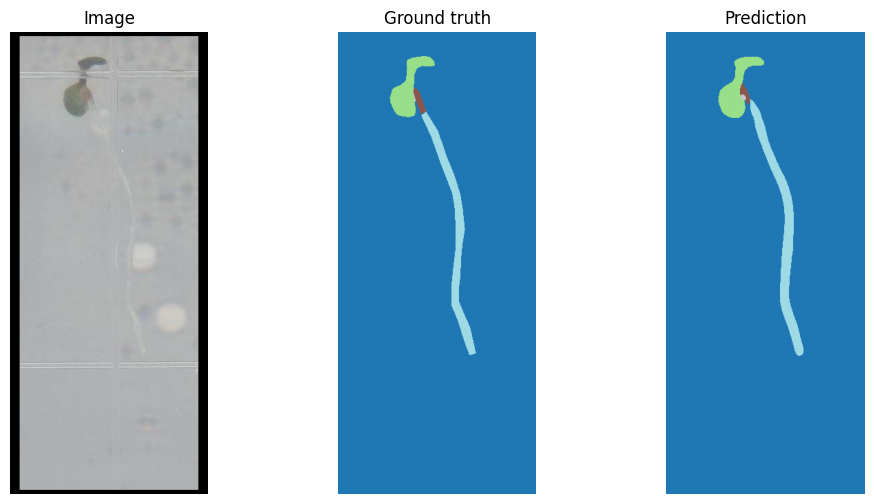

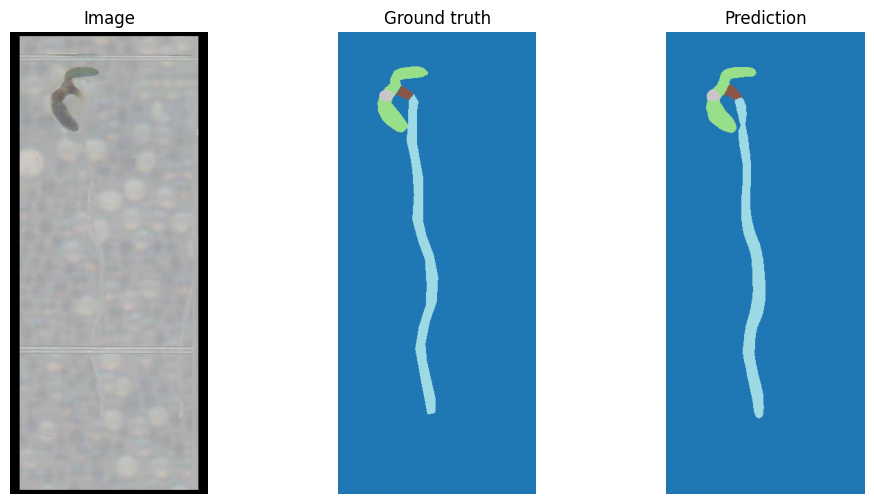

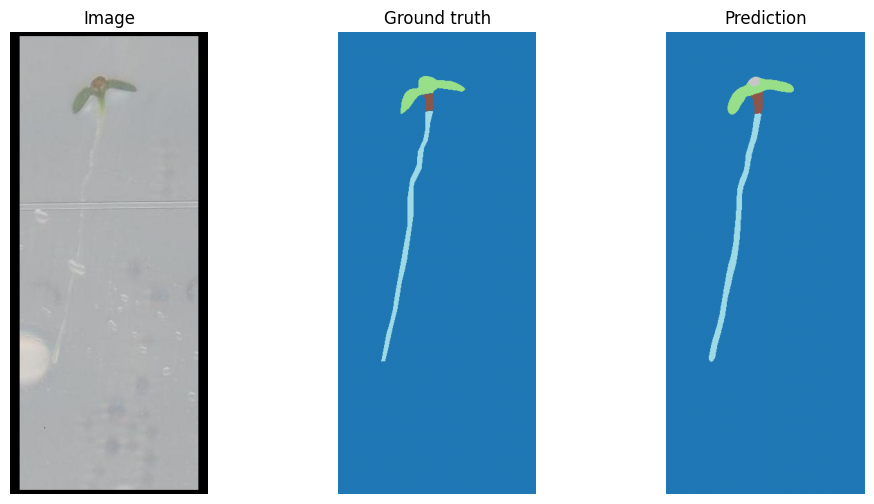

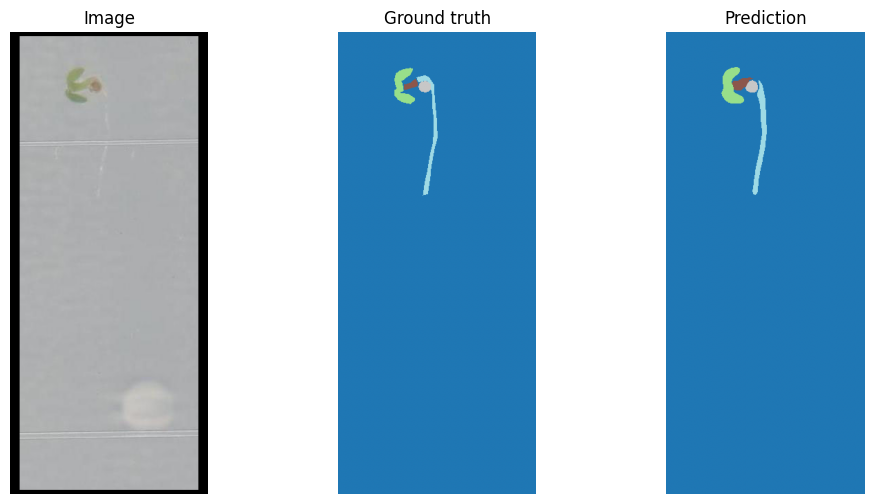

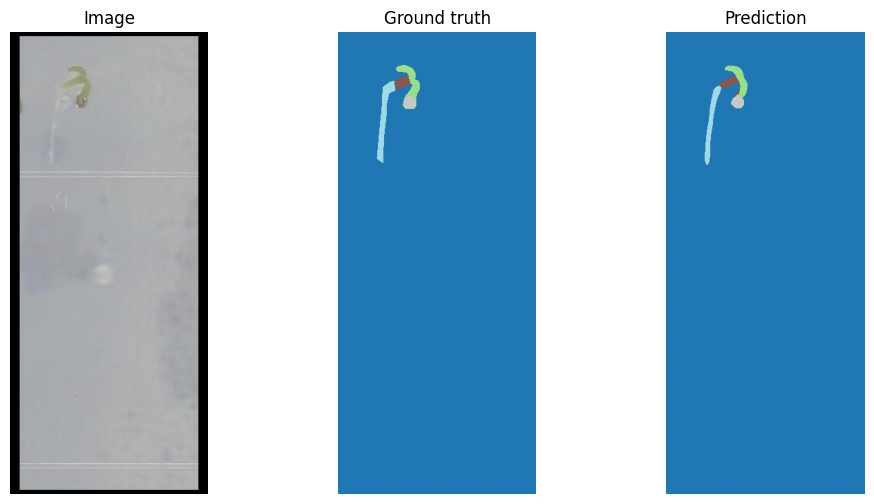

In [31]:
import numpy as np

# Fetch a batch from the test loader
images, masks = next(iter(test_loader))

# Switch the model to evaluation mode
with torch.no_grad():
    model.eval()
    logits = model(images)  # Get raw logits from the model

# Apply softmax to get class probabilities
# Shape: [batch_size, num_classes, H, W]

pr_masks = logits.softmax(dim=1)
# Convert class probabilities to predicted class labels
pr_masks = pr_masks.argmax(dim=1)  # Shape: [batch_size, H, W]

# Visualize a few samples (image, ground truth mask, and predicted mask)
for idx, (image, gt_mask, pr_mask) in enumerate(zip(images, masks, pr_masks)):
    if idx <= 4:  # Visualize first 5 samples
        plt.figure(figsize=(12, 6))

        # Original Image
        plt.subplot(1, 3, 1)
        plt.imshow(
            image.cpu().numpy().transpose(1, 2, 0)
        )  # Convert CHW to HWC for plotting
        plt.title("Image")
        plt.axis("off")

        # Ground Truth Mask
        plt.subplot(1, 3, 2)
        plt.imshow(gt_mask.cpu().numpy(), cmap="tab20")  # Visualize ground truth mask
        plt.title("Ground truth")
        plt.axis("off")

        # Predicted Mask
        plt.subplot(1, 3, 3)
        plt.imshow(pr_mask.cpu().numpy(), cmap="tab20")  # Visualize predicted mask
        plt.title("Prediction")
        plt.axis("off")

        # Show the figure
        plt.show()
    else:
        break

In [35]:
import torch
import numpy as np
import cv2
from scipy.spatial.distance import pdist
from tqdm import tqdm

ROOT_CLASS_ID = 3
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Tracking stats
abs_errors = []
rel_errors = []

model.eval()

with torch.no_grad():
    for idx, (images, gt_masks) in enumerate(test_loader):
        images = images.to(device)
        gt_masks = gt_masks.cpu().numpy()

        # Model prediction
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()

        for i in range(len(images)):
            img_idx = idx * test_loader.batch_size + i + 1

            # Predicted root mask
            root_mask_pred = (preds[i] == ROOT_CLASS_ID).astype(np.uint8)

            # If no pixels found for root class, maybe the seed class is missing — check shifted index
            if root_mask_pred.sum() == 0:
                continue # TODO: we should fix the bug (no seed in image throws off the indexing), but there's no time and we have verified that the masks are legitimate and thus we are not throwing out poor performing samples, but average samples that are hard to work with
                print(f"⚠️ No pixels with ROOT_CLASS_ID={ROOT_CLASS_ID} in image {img_idx}. Checking shifted index...")
                root_mask_pred = (preds[i] == (ROOT_CLASS_ID - 1)).astype(np.uint8)

            # Check number of contours in prediction
            contours, _ = cv2.findContours(root_mask_pred, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if len(contours) != 1:
                print(f"⚠️ Warning: Image {img_idx} has {len(contours)} root contours")

                # Visualize image, GT mask, and prediction
                plt.figure(figsize=(15, 5))

                # Image
                plt.subplot(1, 3, 1)
                plt.imshow(images[i].cpu().numpy().transpose(1, 2, 0))
                plt.title("Image")
                plt.axis("off")

                # Ground Truth Mask
                plt.subplot(1, 3, 2)
                plt.imshow(gt_masks[i], cmap="tab20")
                plt.title("Ground Truth Mask")
                plt.axis("off")

                # Predicted Mask
                plt.subplot(1, 3, 3)
                plt.imshow(preds[i], cmap="tab20")
                plt.title("Predicted Mask")
                plt.axis("off")

                plt.show()

            # Compute max Euclidean distance in the predicted root mask
            coords_pred = np.column_stack(np.where(root_mask_pred == 1))
            if len(coords_pred) > 1:
                hull_pred = cv2.convexHull(coords_pred)
                distances_pred = pdist(hull_pred.squeeze())
                max_dist_pred = distances_pred.max()
            else:
                max_dist_pred = 0.0

            # Ground truth root mask
            root_mask_gt = (gt_masks[i] == ROOT_CLASS_ID).astype(np.uint8)
            coords_gt = np.column_stack(np.where(root_mask_gt == 1))
            if len(coords_gt) > 1:
                hull_gt = cv2.convexHull(coords_gt)
                distances_gt = pdist(hull_gt.squeeze())
                max_dist_gt = distances_gt.max()
            else:
                max_dist_gt = 0.0

            # Get error stats
            abs_error = abs(max_dist_pred - max_dist_gt)
            rel_error = (abs_error / max_dist_gt * 100) if max_dist_gt != 0 else 0

            abs_errors.append(abs_error)
            rel_errors.append(rel_error)

            # Progress update
            if img_idx % 10 == 0:
                print(f"✅ Processed {img_idx}/{len(test_loader.dataset)} images")

# Summary stats
mean_abs_error = np.mean(abs_errors)
max_abs_error = np.max(abs_errors)
min_abs_error = np.min(abs_errors)
q1_abs_error = np.percentile(abs_errors, 25)
q3_abs_error = np.percentile(abs_errors, 75)

mean_rel_error = np.mean(rel_errors)
max_rel_error = np.max(rel_errors)
min_rel_error = np.min(rel_errors)
q1_rel_error = np.percentile(rel_errors, 25)
q3_rel_error = np.percentile(rel_errors, 75)

print(f"\n📊 Root Length Prediction Stats (Max Euclidean Distance in pixels):")
print(f"Mean Absolute Error: {mean_abs_error:.2f} pixels")
print(f"Best (smallest) Absolute Error: {min_abs_error:.2f} pixels")
print(f"Worst (biggest) Absolute Error: {max_abs_error:.2f} pixels")
print(f"Q1 Absolute Error: {q1_abs_error:.2f} pixels")
print(f"Q3 Absolute Error: {q3_abs_error:.2f} pixels")

print(f"Mean Relative Error: {mean_rel_error:.2f}%")
print(f"Best (smallest) Relative Error: {min_rel_error:.2f}%")
print(f"Worst (biggest) Relative Error: {max_rel_error:.2f}%")
print(f"Q1 Relative Error: {q1_rel_error:.2f}%")
print(f"Q3 Relative Error: {q3_rel_error:.2f}%")

✅ Processed 20/56 images
✅ Processed 30/56 images
✅ Processed 40/56 images
✅ Processed 50/56 images

📊 Root Length Prediction Stats (Max Euclidean Distance in pixels):
Mean Absolute Error: 2.17 pixels
Best (smallest) Absolute Error: 0.00 pixels
Worst (biggest) Absolute Error: 19.42 pixels
Q1 Absolute Error: 0.50 pixels
Q3 Absolute Error: 2.19 pixels
Mean Relative Error: 7.06%
Best (smallest) Relative Error: 0.00%
Worst (biggest) Relative Error: 35.75%
Q1 Relative Error: 2.00 pixels
Q3 Relative Error: 9.79 pixels
